In [1]:
import sys
sys.path.insert(0, "..")

import random
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import torch
import pyro
import foraging_toolkit as ft
import torch.nn.functional as F
import pyro.distributions as dist
import pyro.optim as optim
from pyro.nn import PyroModule
from pyro.infer.autoguide import AutoNormal, AutoDiagonalNormal, AutoMultivariateNormal, init_to_mean, init_to_value
from pyro.contrib.autoguide import AutoLaplaceApproximation
from pyro.infer import SVI, Trace_ELBO
from pyro.optim import Adam
from pyro.infer import Predictive
from pyro.infer import MCMC, NUTS

import os
import logging
logging.basicConfig(format='%(message)s', level=logging.INFO)
smoke_test = ('CI' in os.environ)


#import foraging_toolkit as ft

In [2]:
with open('communicatorsDFs.pkl', 'rb') as f:
    communicatorsDFs = pickle.load(f)
birdsDF = communicatorsDFs[0]
rewardsDF = communicatorsDFs[1]
birdsDF = birdsDF[birdsDF['bird']  >= 3]
indices_to_rename = birdsDF[birdsDF["bird"].isin([3, 4])].index
new_values = birdsDF.loc[indices_to_rename, "bird"].replace({3: 1, 4: 2})
birdsDF.loc[indices_to_rename, "bird"] = new_values
communicators = ft.object_from_data(birdsDF, rewardsDF)

In [3]:
ft.animate_birds(communicators, plot_rewards=True,
                  width = 600, height = 600, point_size = 10)

In [4]:
communicators_derived = ft.derive_predictors(communicators, visibility_range=5,
                                             generate_communicates= True)

In [5]:
ft.animate_birds(communicators_derived, plot_rewards=True, width = 600,
                  height = 600, point_size = 10,plot_traces=True, trace_multiplier=1.5)

In [6]:
ft.animate_birds(communicators_derived, plot_rewards=True, width = 600,
                  height = 600, point_size = 10, 
                  plot_visibility=2, plot_traces=True, trace_multiplier= 1)

In [7]:
ft.animate_birds(communicators_derived, plot_rewards=True, width = 600,
                  height = 600, point_size = 10, 
                  plot_visibility=2,
                  plot_communicate = 2,
                  plot_traces=True, communicate_multiplier = 
                  13, trace_multiplier= 1)

## Inference


In [8]:

def prep_data_for__communicators_inference(sim_derived):

    print("Initial dataset size:", sim_derived.derivedDF.shape[0])
    df = sim_derived.derivedDF.copy().dropna()
    print("Complete cases:", df.shape[0])
    #large drop expected as we only care about points within birds' visibility range
    #and many communicates are outside of it

    data = torch.tensor(df[["trace_standardized", "proximity_standardized", "visibility", "communicate_standardized",
                          "how_far_squared_scaled"]].values, dtype=torch.float32)


    trace, proximity, visibility, communicate, how_far = data[:, 0], data[:, 1], data[:, 2], data[:, 3], data[:, 4]
    
    
    print(str(len(proximity)) + " data points prepared for inference.")
    
    return trace, proximity, visibility, communicate, how_far

trace, proximity, visibility, communicate, how_far_score = prep_data_for__communicators_inference(communicators_derived)

Initial dataset size: 5048
Complete cases: 1166
1166 data points prepared for inference.


In [9]:
ft.visualise_bird_predictors(trace,proximity, how_far_score, com =  communicate)

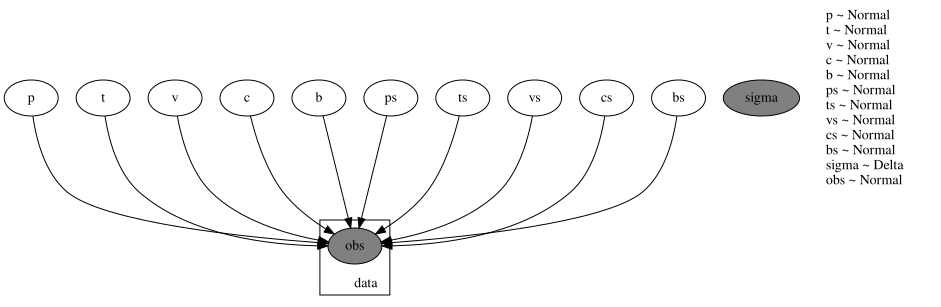

In [10]:
def model_sigmavar_com(proximity, trace, visibility, communicate, how_far_score):
    p = pyro.sample("p", dist.Normal(0, .3))
    t = pyro.sample("t", dist.Normal(0, .3))
    v = pyro.sample("v", dist.Normal(0, .3))
    c = pyro.sample("c", dist.Normal(0, .3))
    b = pyro.sample("b", dist.Normal(.5, .3))

    ps = pyro.sample("ps", dist.Normal(0, .3))
    ts = pyro.sample("ts", dist.Normal(0, .3))
    vs = pyro.sample("vs", dist.Normal(0, .3))
    cs = pyro.sample("cs", dist.Normal(0, .3))
    bs = pyro.sample("bs", dist.Normal(.2, .3))


    sigmaRaw = bs + ps * proximity + ts * trace + vs * visibility + cs * communicate
    sigma = pyro.deterministic("sigma", F.softplus(sigmaRaw))
    mean = b + p * proximity + t * trace + v * visibility + c * communicate

    with pyro.plate("data", len(how_far_score)):
        pyro.sample("obs", dist.Normal(mean, sigma), obs=how_far_score)

pyro.render_model(model_sigmavar_com, model_args=(proximity, trace, visibility,
                                               communicate, how_far_score),
                        render_distributions=True)

In [11]:
# Inference with SVI
# note how long this takes
# and compare time with MCM 

guide = AutoMultivariateNormal(model_sigmavar_com, init_loc_fn=init_to_mean)
svi = SVI(model_sigmavar_com,
        guide,
        optim.Adam({"lr": .01}),
        loss=Trace_ELBO())

iterations = []
losses = []

pyro.clear_param_store()
num_iters = 1000
for i in range(num_iters):
    elbo = svi.step(proximity, trace, visibility, communicate, how_far_score)
    iterations.append(i)
    losses.append(elbo)
    if i % 200 == 0:
        logging.info("Elbo loss: {}".format(elbo))


2023-08-04 12:01:34,883:  Elbo loss: 1021.5703521966934
2023-08-04 12:01:38,635:  Elbo loss: -784.5721343159676
2023-08-04 12:01:42,076:  Elbo loss: -868.8555607199669
2023-08-04 12:01:45,219:  Elbo loss: -1041.9352307915688
2023-08-04 12:01:48,397:  Elbo loss: -1143.3825281858444


In [12]:
num_samples = 1000
predictive = Predictive(model_sigmavar_com, guide=guide, 
                        num_samples=num_samples,
                        return_sites = ["t", "p", "c"])
communicate_sigmavar = {k: v.flatten().reshape(num_samples, -1).detach().cpu().numpy()
            for k, v in predictive(proximity, trace, visibility, communicate, how_far_score).items()
            if k != "obs"}

for site, values in ft.summary(communicate_sigmavar, ["t", "p", "c"]).items():
            print("Site: {}".format(site))
            print(values, "\n")

Site: p
       mean       std        5%      25%       50%      75%       95%
0  0.002787  0.009425 -0.012999 -0.00361  0.002691  0.00911  0.018277 

Site: t
       mean       std        5%      25%       50%       75%       95%
0  0.001325  0.011067 -0.016459 -0.00627  0.001434  0.008563  0.019598 

Site: c
       mean       std        5%       25%       50%       75%       95%
0  0.010267  0.012866 -0.010793  0.001522  0.010063  0.019307  0.030549 



In [18]:
# warning: MCMC training might take a bit of time to run if num_samples is large

num_samples = 200 # a bit low, restricted for speed
nuts_kernel = NUTS(model_sigmavar_com)
mcmc = MCMC(nuts_kernel, num_samples=num_samples, warmup_steps=num_samples//4)
mcmc.run(proximity, trace, visibility, communicate, how_far_score)

#communicate_sigmavar_mcmc = ft.mcmc_training(model_sigmavar_com, 1000, proximity, trace, visibility, communicate, how_far_score)

Sample: 100%|██████████| 250/250 [00:14, 17.24it/s, step size=2.94e-03, acc. prob=0.192]


In [19]:
communicate_sigmavar_mcmc = {k: v.detach().cpu().numpy() for k, v in mcmc.get_samples().items()}

for site, values in ft.summary(communicate_sigmavar_mcmc, ["t","p", "c"]).items():
    print("Site: {}".format(site))
    print(values, "\n")

Site: c
       mean       std       5%       25%       50%       75%       95%
0  0.014629  0.003245  0.00965  0.012157  0.014581  0.017003  0.019118 

Site: p
       mean       std        5%       25%       50%       75%       95%
0 -0.003352  0.007509 -0.008969 -0.003719 -0.002028 -0.000453  0.001978 

Site: t
       mean       std        5%       25%       50%       75%       95%
0  0.004133  0.002543  0.000857  0.002352  0.004644  0.005576  0.007309 



In [20]:

def plot_svi_mcmc_coefficients_3d(svi_sample, mcmc_sample, title, xlim=0.1, ylim=0.1, zlim=0.1):

    site_p_svi = svi_sample['p'].flatten().tolist()
    site_t_svi = svi_sample['t'].flatten().tolist()
    site_c_svi = svi_sample['c'].flatten().tolist()
    site_p_mcmc = mcmc_sample['p'].flatten().tolist()
    site_t_mcmc = mcmc_sample['t'].flatten().tolist()
    site_c_mcmc = mcmc_sample['c'].flatten().tolist()

    source_svi = ['svi'] * len(site_p_svi)
    source_mcmc = ['mcmc'] * len(site_p_mcmc)

    data = {
        'p': site_p_svi + site_p_mcmc,
        't': site_t_svi + site_t_mcmc,
        'c': site_c_svi + site_c_mcmc,
        'inference_method': source_svi + source_mcmc
    }

    df = pd.DataFrame(data)

    fig = px.scatter_3d(df, x='p', y='t', z='c', color='inference_method',
                        title=title,
                        template='plotly_dark')

    fig.update_scenes(xaxis_range=[-xlim, xlim], yaxis_range=[-ylim, ylim], zaxis_range=[-zlim, zlim])

    fig.update_layout(autosize=False,
                      width=800,
                      height=800
                      )

    fig.update_traces(marker=dict(size=3.5, opacity=0.4))

    fig.show()



In [22]:

plot_svi_mcmc_coefficients_3d(communicate_sigmavar, communicate_sigmavar_mcmc, 'Samples from the posterior', xlim=0.05, ylim=0.05, zlim=0.05)


In [41]:

site_names = ['p', 't', 'c']

svi_p = communicate_sigmavar['p'].flatten().tolist()
mcmc_p = communicate_sigmavar_mcmc['p'].flatten().tolist()

svi_t = communicate_sigmavar['t'].flatten().tolist()
mcmc_t = communicate_sigmavar_mcmc['t'].flatten().tolist()


svi_c = communicate_sigmavar['c'].flatten().tolist()
mcmc_c = communicate_sigmavar_mcmc['c'].flatten().tolist()


site_data = {
#    'Site': site_names * len(svi_p),
    'p': svi_p + mcmc_p,
    't': svi_t + mcmc_t,
    'c': svi_c + mcmc_c,
    'Method': ['SVI'] * len(svi_p) + ['MCMC'] * len(mcmc_p)
}

df = pd.DataFrame(site_data)

fig1 = px.histogram(df, x='p', color='Method',
                     title="Proximity", template='plotly_dark')

fig1.update_layout(autosize=False, width=800, height=400)
fig1.update_traces(opacity=0.4)


fig2 = px.histogram(df, x='t', color='Method',
                     title="Trace", template='plotly_dark')

fig2.update_layout(autosize=False, width=800, height=400)
fig2.update_traces(opacity=0.4)


fig3 = px.histogram(df, x='c', color='Method',
                     title="Communicate", template='plotly_dark')

fig3.update_layout(autosize=False, width=800, height=400)
fig3.update_traces(opacity=0.4)


fig1.show()
fig2.show()
fig3.show()

#note: we only had two birds and one food patch, likely will improve with better data



In [25]:


plot_svi_mcmc_histograms(communicate_sigmavar, communicate_sigmavar_mcmc, 'Samples for the posterior')


ValueError: All arrays must be of the same length